# 📊 Credit Card Fraud Detection - Exploratory Data Analysis

## MLZoomcamp Capstone Project

---

### 📋 Project Overview

This notebook performs comprehensive exploratory data analysis (EDA) on the Credit Card Fraud Detection dataset. We'll uncover patterns, understand the data distribution, and prepare insights for building our PyTorch-based anomaly detection models.

### 🎯 Objectives

1. **Understand the data structure** and features
2. **Analyze class imbalance** and its implications
3. **Explore feature distributions** and relationships
4. **Identify patterns** in fraudulent vs normal transactions
5. **Prepare insights** for feature engineering

---

## 1. Environment Setup and Imports

In [1]:
# System and environment
import os
import sys
import warnings
warnings.filterwarnings('ignore')

# Data manipulation
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import normaltest, skew, kurtosis

# Visualization
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# ML utilities
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split

# Display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Style settings
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# Custom color palette
COLORS = {
    'normal': '#2E7D32',  # Green
    'fraud': '#C62828',   # Red
    'primary': '#1565C0',  # Blue
    'secondary': '#FF6F00', # Orange
    'background': '#FAFAFA',
    'grid': '#E0E0E0'
}

print("📦 Libraries imported successfully")
print(f"📊 Pandas version: {pd.__version__}")
print(f"📈 NumPy version: {np.__version__}")
print(f"🎨 Matplotlib version: {plt.matplotlib.__version__}")

📦 Libraries imported successfully
📊 Pandas version: 2.3.3
📈 NumPy version: 2.4.0
🎨 Matplotlib version: 3.10.8


## 2. Data Loading and Initial Inspection

In [2]:
# Load the dataset
# Note: Download from https://www.kaggle.com/mlg-ulb/creditcardfraud
data_path = '../data/creditcard.csv'

try:
    df = pd.read_csv(data_path)
    print("✅ Data loaded successfully!")
except FileNotFoundError:
    print("❌ Data file not found. Please download it from Kaggle:")
    print("   https://www.kaggle.com/mlg-ulb/creditcardfraud")
    print("   Place it in the 'data/' directory")
    raise

# Display basic information
print(f"\n📊 Dataset Shape: {df.shape[0]:,} transactions × {df.shape[1]} features")
print(f"💾 Memory Usage: {df.memory_usage().sum() / 1024**2:.2f} MB")

✅ Data loaded successfully!

📊 Dataset Shape: 284,807 transactions × 31 features
💾 Memory Usage: 67.36 MB


In [3]:
# Display first few rows
print("\n🔍 First 5 transactions:")
df.head()


🔍 First 5 transactions:


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.000,-1.360,-0.073,2.536,1.378,-0.338,0.462,0.240,0.099,0.364,0.091,-0.552,-0.618,-0.991,-0.311,1.468,-0.470,0.208,0.026,0.404,0.251,-0.018,0.278,-0.110,0.067,0.129,-0.189,0.134,-0.021,149.620,0
1,0.000,1.192,0.266,0.166,0.448,0.060,-0.082,-0.079,0.085,-0.255,-0.167,1.613,1.065,0.489,-0.144,0.636,0.464,-0.115,-0.183,-0.146,-0.069,-0.226,-0.639,0.101,-0.340,0.167,0.126,-0.009,0.015,2.690,0
2,1.000,-1.358,-1.340,1.773,0.380,-0.503,1.800,0.791,0.248,-1.515,0.208,0.625,0.066,0.717,-0.166,2.346,-2.890,1.110,-0.121,-2.262,0.525,0.248,0.772,0.909,-0.689,-0.328,-0.139,-0.055,-0.060,378.660,0
3,1.000,-0.966,-0.185,1.793,-0.863,-0.010,1.247,0.238,0.377,-1.387,-0.055,-0.226,0.178,0.508,-0.288,-0.631,-1.060,-0.684,1.966,-1.233,-0.208,-0.108,0.005,-0.190,-1.176,0.647,-0.222,0.063,0.061,123.500,0
4,2.000,-1.158,0.878,1.549,0.403,-0.407,0.096,0.593,-0.271,0.818,0.753,-0.823,0.538,1.346,-1.120,0.175,-0.451,-0.237,-0.038,0.803,0.409,-0.009,0.798,-0.137,0.141,-0.206,0.502,0.219,0.215,69.990,0


In [4]:
# Data types and missing values
print("\n📋 Data Information:")
print("="*50)
info_df = pd.DataFrame({
    'Data Type': df.dtypes,
    'Non-Null Count': df.count(),
    'Null Count': df.isnull().sum(),
    'Null %': (df.isnull().sum() / len(df) * 100).round(2),
    'Unique Values': df.nunique()
})
info_df


📋 Data Information:


,Data Type,Non-Null Count,Null Count,Null %,Unique Values
Time,float64,284807,0,0.000,124592
V1,float64,284807,0,0.000,275663
V2,float64,284807,0,0.000,275663
V3,float64,284807,0,0.000,275663
V4,float64,284807,0,0.000,275663
V5,float64,284807,0,0.000,275663
V6,float64,284807,0,0.000,275663
V7,float64,284807,0,0.000,275663
V8,float64,284807,0,0.000,275663
V9,float64,284807,0,0.000,275663


In [5]:
# Statistical summary
print("\n📊 Statistical Summary:")
df.describe().T


📊 Statistical Summary:


,count,mean,std,min,25%,50%,75%,max
Time,284807.000,94813.860,47488.146,0.000,54201.500,84692.000,139320.500,172792.000
V1,284807.000,0.000,1.959,-56.408,-0.920,0.018,1.316,2.455
V2,284807.000,0.000,1.651,-72.716,-0.599,0.065,0.804,22.058
V3,284807.000,-0.000,1.516,-48.326,-0.890,0.180,1.027,9.383
V4,284807.000,0.000,1.416,-5.683,-0.849,-0.020,0.743,16.875
V5,284807.000,0.000,1.380,-113.743,-0.692,-0.054,0.612,34.802
V6,284807.000,0.000,1.332,-26.161,-0.768,-0.274,0.399,73.302
V7,284807.000,-0.000,1.237,-43.557,-0.554,0.040,0.570,120.589
V8,284807.000,0.000,1.194,-73.217,-0.209,0.022,0.327,20.007
V9,284807.000,-0.000,1.099,-13.434,-0.643,-0.051,0.597,15.595


## 3. Class Distribution Analysis

In [6]:
# Class distribution
class_dist = df['Class'].value_counts()
class_pct = df['Class'].value_counts(normalize=True) * 100

print("\n🎯 Class Distribution:")
print("="*40)
print(f"Normal Transactions (0): {class_dist[0]:,} ({class_pct[0]:.3f}%)")
print(f"Fraud Transactions (1):  {class_dist[1]:,} ({class_pct[1]:.3f}%)")
print(f"\nImbalance Ratio: 1:{int(class_dist[0]/class_dist[1])}")


🎯 Class Distribution:
Normal Transactions (0): 284,315 (99.827%)
Fraud Transactions (1):  492 (0.173%)

Imbalance Ratio: 1:577


In [7]:
# Visualize class distribution
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=('Transaction Count', 'Percentage Distribution'),
    specs=[[{'type': 'bar'}, {'type': 'pie'}]]
)

# Bar chart
fig.add_trace(
    go.Bar(
        x=['Normal', 'Fraud'],
        y=class_dist.values,
        marker_color=[COLORS['normal'], COLORS['fraud']],
        text=class_dist.values,
        textposition='outside',
        texttemplate='%{text:,}',
        name='Count'
    ),
    row=1, col=1
)

# Pie chart
fig.add_trace(
    go.Pie(
        labels=['Normal', 'Fraud'],
        values=class_dist.values,
        marker_colors=[COLORS['normal'], COLORS['fraud']],
        textfont_size=14,
        textposition='auto',
        textinfo='label+percent',
        hole=0.3,
        name='Percentage'
    ),
    row=1, col=2
)

fig.update_layout(
    title_text="Credit Card Transaction Class Distribution",
    showlegend=False,
    height=400,
    template='plotly_white'
)

fig.show()

## 4. Feature Analysis

### 4.1 Understanding the Features

In [8]:
# Feature categories
print("\n📊 Feature Breakdown:")
print("="*50)

# PCA features (V1-V28)
pca_features = [f'V{i}' for i in range(1, 29)]
print(f"\n🔄 PCA-transformed features (V1-V28): {len(pca_features)} features")
print("   These are the result of PCA transformation for privacy")

# Original features
print(f"\n⏰ Time: Seconds elapsed between this and first transaction")
print(f"💰 Amount: Transaction amount")
print(f"🎯 Class: Target variable (0=Normal, 1=Fraud)")

# Feature groups
feature_groups = {
    'PCA Features': pca_features,
    'Original Features': ['Time', 'Amount'],
    'Target': ['Class']
}


📊 Feature Breakdown:

🔄 PCA-transformed features (V1-V28): 28 features
   These are the result of PCA transformation for privacy

⏰ Time: Seconds elapsed between this and first transaction
💰 Amount: Transaction amount
🎯 Class: Target variable (0=Normal, 1=Fraud)


### 4.2 Time Feature Analysis

In [9]:
# Analyze Time feature
print("\n⏰ Time Feature Analysis:")
print("="*50)

# Convert to hours and days
df['Hour'] = (df['Time'] / 3600) % 24
df['Day'] = np.floor(df['Time'] / (3600 * 24))

print(f"Time span: {df['Time'].min():.0f} - {df['Time'].max():.0f} seconds")
print(f"Duration: {df['Day'].max():.0f} days")
print(f"Average time between transactions: {df['Time'].diff().mean():.2f} seconds")


⏰ Time Feature Analysis:
Time span: 0 - 172792 seconds
Duration: 1 days
Average time between transactions: 0.61 seconds


In [10]:
# Visualize transactions over time
fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=('Transactions by Hour of Day', 'Fraud Rate by Hour'),
    vertical_spacing=0.1
)

# Transactions by hour
hourly_counts = df.groupby('Hour')['Class'].agg(['count', 'sum'])
hourly_counts['fraud_rate'] = (hourly_counts['sum'] / hourly_counts['count']) * 100

fig.add_trace(
    go.Bar(
        x=hourly_counts.index,
        y=hourly_counts['count'],
        name='Total Transactions',
        marker_color=COLORS['primary']
    ),
    row=1, col=1
)

# Fraud rate by hour
fig.add_trace(
    go.Scatter(
        x=hourly_counts.index,
        y=hourly_counts['fraud_rate'],
        mode='lines+markers',
        name='Fraud Rate (%)',
        marker_color=COLORS['fraud'],
        line=dict(width=3)
    ),
    row=2, col=1
)

fig.update_xaxes(title_text="Hour of Day", row=2, col=1)
fig.update_yaxes(title_text="Count", row=1, col=1)
fig.update_yaxes(title_text="Fraud Rate (%)", row=2, col=1)

fig.update_layout(
    height=600,
    showlegend=False,
    title_text="Transaction Patterns Over Time",
    template='plotly_white'
)

fig.show()

### 4.2.1 Leakage-safe split plan (for modeling)

Because this dataset includes a monotonic `Time` field (seconds since the first transaction), a **random stratified split can leak future patterns** into training.

**Plan used in the modeling/training pipeline:**
- Sort by `Time`
- Split chronologically: **70% train / 15% validation / 15% test**
- For anomaly models (AE / VAE / Deep SVDD): train using **normal transactions only** (`Class==0`) from the **train** slice
- Fit scalers **only on normal-train**, then transform val/test


### 4.3 Amount Feature Analysis

In [11]:
# Amount statistics by class
print("\n💰 Transaction Amount Analysis:")
print("="*50)

amount_stats = df.groupby('Class')['Amount'].agg([
    'count', 'mean', 'median', 'std', 'min', 'max',
    ('q25', lambda x: x.quantile(0.25)),
    ('q75', lambda x: x.quantile(0.75))
])

amount_stats.index = ['Normal', 'Fraud']
print(amount_stats.round(2))

# Statistical test for difference in means
normal_amounts = df[df['Class'] == 0]['Amount']
fraud_amounts = df[df['Class'] == 1]['Amount']

t_stat, p_value = stats.ttest_ind(normal_amounts, fraud_amounts)
print(f"\n📊 T-test for amount difference:")
print(f"   T-statistic: {t_stat:.4f}")
print(f"   P-value: {p_value:.4e}")
print(f"   Significant difference: {'Yes' if p_value < 0.05 else 'No'}")


💰 Transaction Amount Analysis:
         count    mean  median     std   min       max   q25     q75
Normal  284315  88.290  22.000 250.110 0.000 25691.160 5.650  77.050
Fraud      492 122.210   9.250 256.680 0.000  2125.870 1.000 105.890

📊 T-test for amount difference:
   T-statistic: -3.0056
   P-value: 2.6512e-03
   Significant difference: Yes


In [12]:
# Amount distribution visualization
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=(
        'Normal Transactions - Amount Distribution',
        'Fraud Transactions - Amount Distribution',
        'Normal Transactions - Log(Amount+1)',
        'Fraud Transactions - Log(Amount+1)'
    )
)

# Normal amounts
fig.add_trace(
    go.Histogram(
        x=normal_amounts[normal_amounts <= 500],  # Focus on smaller amounts
        nbinsx=50,
        name='Normal',
        marker_color=COLORS['normal'],
        opacity=0.7
    ),
    row=1, col=1
)

# Fraud amounts
fig.add_trace(
    go.Histogram(
        x=fraud_amounts[fraud_amounts <= 500],
        nbinsx=50,
        name='Fraud',
        marker_color=COLORS['fraud'],
        opacity=0.7
    ),
    row=1, col=2
)

# Log-transformed normal amounts
fig.add_trace(
    go.Histogram(
        x=np.log1p(normal_amounts),
        nbinsx=50,
        name='Normal (log)',
        marker_color=COLORS['normal'],
        opacity=0.7
    ),
    row=2, col=1
)

# Log-transformed fraud amounts
fig.add_trace(
    go.Histogram(
        x=np.log1p(fraud_amounts),
        nbinsx=50,
        name='Fraud (log)',
        marker_color=COLORS['fraud'],
        opacity=0.7
    ),
    row=2, col=2
)

fig.update_xaxes(title_text="Amount ($)", row=1, col=1)
fig.update_xaxes(title_text="Amount ($)", row=1, col=2)
fig.update_xaxes(title_text="Log(Amount+1)", row=2, col=1)
fig.update_xaxes(title_text="Log(Amount+1)", row=2, col=2)

fig.update_layout(
    height=700,
    showlegend=False,
    title_text="Transaction Amount Distributions",
    template='plotly_white'
)

fig.show()

### 4.4 PCA Features Analysis

In [13]:
# Analyze PCA features distribution
pca_stats = pd.DataFrame()

for feature in pca_features[:5]:  # Analyze first 5 PCA features
    normal_values = df[df['Class'] == 0][feature]
    fraud_values = df[df['Class'] == 1][feature]
    
    # KS test for distribution difference
    ks_stat, ks_pval = stats.ks_2samp(normal_values, fraud_values)
    
    pca_stats = pd.concat([pca_stats, pd.DataFrame({
        'Feature': [feature],
        'Normal_Mean': [normal_values.mean()],
        'Fraud_Mean': [fraud_values.mean()],
        'Mean_Diff': [abs(normal_values.mean() - fraud_values.mean())],
        'Normal_Std': [normal_values.std()],
        'Fraud_Std': [fraud_values.std()],
        'KS_Statistic': [ks_stat],
        'KS_P_Value': [ks_pval]
    })], ignore_index=True)

print("\n🔄 PCA Features Statistical Comparison (Top 5):")
print("="*70)
print(pca_stats.round(4))


🔄 PCA Features Statistical Comparison (Top 5):
  Feature  Normal_Mean  Fraud_Mean  Mean_Diff  Normal_Std  Fraud_Std  \
0      V1        0.008      -4.772      4.780       1.930      6.784   
1      V2       -0.006       3.624      3.630       1.636      4.291   
2      V3        0.012      -7.033      7.045       1.459      7.111   
3      V4       -0.008       4.542      4.550       1.399      2.873   
4      V5        0.005      -3.151      3.157       1.357      5.372   

   KS_Statistic  KS_P_Value  
0         0.475       0.000  
1         0.633       0.000  
2         0.704       0.000  
3         0.766       0.000  
4         0.436       0.000  


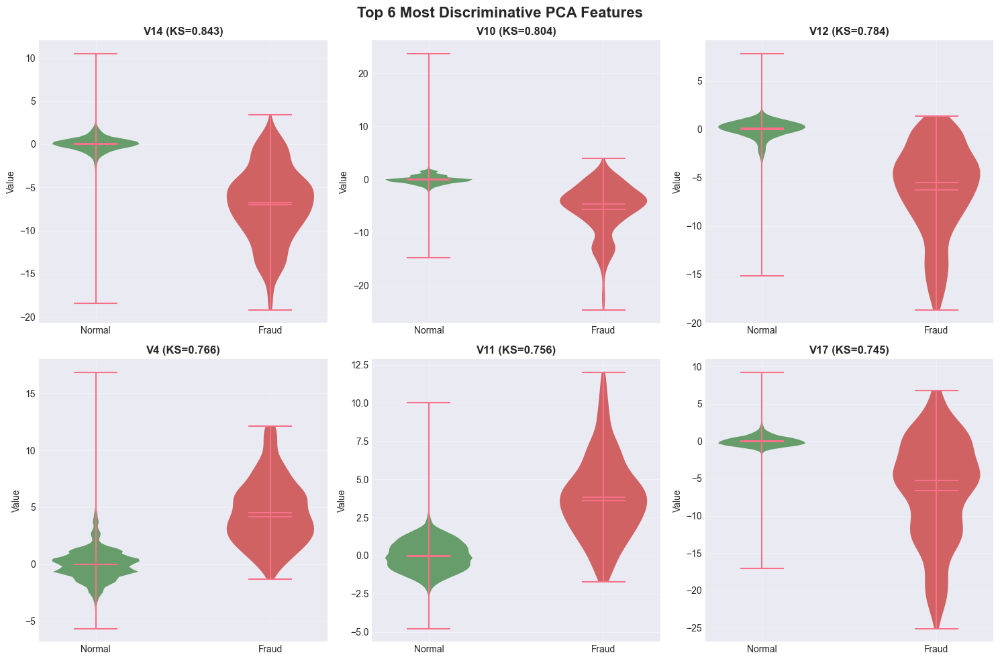

In [14]:
# Visualize PCA features with highest discrimination
# Calculate discrimination power for all PCA features
discrimination_scores = {}

for feature in pca_features:
    normal_values = df[df['Class'] == 0][feature]
    fraud_values = df[df['Class'] == 1][feature]
    
    # Use KS statistic as discrimination score
    ks_stat, _ = stats.ks_2samp(normal_values, fraud_values)
    discrimination_scores[feature] = ks_stat

# Sort features by discrimination power
top_discriminative = sorted(discrimination_scores.items(), key=lambda x: x[1], reverse=True)[:6]

# Create violin plots for top discriminative features
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Top 6 Most Discriminative PCA Features', fontsize=16, fontweight='bold')

for idx, (feature, score) in enumerate(top_discriminative):
    ax = axes[idx // 3, idx % 3]
    
    # Create violin plot
    data_to_plot = [
        df[df['Class'] == 0][feature].values,
        df[df['Class'] == 1][feature].values
    ]
    
    parts = ax.violinplot(data_to_plot, positions=[0, 1], showmeans=True, showmedians=True)
    
    # Customize colors
    colors = [COLORS['normal'], COLORS['fraud']]
    for pc, color in zip(parts['bodies'], colors):
        pc.set_facecolor(color)
        pc.set_alpha(0.7)
    
    ax.set_title(f'{feature} (KS={score:.3f})', fontweight='bold')
    ax.set_xticks([0, 1])
    ax.set_xticklabels(['Normal', 'Fraud'])
    ax.set_ylabel('Value')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## 5. Correlation Analysis

In [15]:
# Calculate correlation with target
target_correlations = df.drop(['Hour', 'Day'], axis=1).corr()['Class'].sort_values(ascending=False)

print("\n📊 Feature Correlations with Fraud (Class):")
print("="*50)
print("\nTop Positive Correlations:")
print(target_correlations[1:11])  # Exclude Class itself
print("\nTop Negative Correlations:")
print(target_correlations[-10:])


📊 Feature Correlations with Fraud (Class):

Top Positive Correlations:
V11      0.155
V4       0.133
V2       0.091
V21      0.040
V19      0.035
V20      0.020
V8       0.020
V27      0.018
V28      0.010
Amount   0.006
Name: Class, dtype: float64

Top Negative Correlations:
V9    -0.098
V1    -0.101
V18   -0.111
V7    -0.187
V3    -0.193
V16   -0.197
V10   -0.217
V12   -0.261
V14   -0.303
V17   -0.326
Name: Class, dtype: float64


In [16]:
# Visualize correlations
fig = go.Figure()

# Select top correlations
top_positive = target_correlations[1:11]
top_negative = target_correlations[-10:]
top_correlations = pd.concat([top_positive, top_negative])

# Create bar chart
colors = ['green' if x > 0 else 'red' for x in top_correlations.values]

fig.add_trace(go.Bar(
    x=top_correlations.values,
    y=top_correlations.index,
    orientation='h',
    marker=dict(
        color=top_correlations.values,
        colorscale='RdBu_r',
        cmid=0,
        colorbar=dict(title="Correlation")
    ),
    text=[f'{x:.3f}' for x in top_correlations.values],
    textposition='outside'
))

fig.update_layout(
    title="Top 20 Feature Correlations with Fraud",
    xaxis_title="Correlation Coefficient",
    yaxis_title="Feature",
    height=600,
    template='plotly_white',
    showlegend=False
)

fig.show()

In [17]:
# Correlation heatmap for top features
# Select features with highest correlation to fraud
important_features = list(target_correlations[1:11].index) + list(target_correlations[-10:].index) + ['Class']
correlation_matrix = df[important_features].corr()

# Create heatmap
fig = go.Figure(data=go.Heatmap(
    z=correlation_matrix.values,
    x=correlation_matrix.columns,
    y=correlation_matrix.columns,
    colorscale='RdBu_r',
    zmid=0,
    text=correlation_matrix.values.round(2),
    texttemplate="%{text}",
    textfont={"size": 8},
    colorbar=dict(title="Correlation")
))

fig.update_layout(
    title="Correlation Heatmap - Most Important Features",
    height=800,
    width=900,
    template='plotly_white'
)

fig.show()

## 6. Dimensionality Reduction Visualization

In [18]:
# Sample data for visualization (t-SNE is computationally expensive)
# NOTE: random sampling can include very few fraud points (~0.17% fraud rate).
# Better: include ALL fraud + a random subset of normal transactions.
sample_size = 10000

df_fraud = df[df['Class'] == 1]
n_fraud = len(df_fraud)
n_normal = max(sample_size - n_fraud, 0)

df_normal = df[df['Class'] == 0].sample(n=min(n_normal, (df['Class'] == 0).sum()), random_state=42)
df_sample = pd.concat([df_fraud, df_normal], axis=0).sample(frac=1, random_state=42).reset_index(drop=True)

print(f"Sample size: {len(df_sample)} | Fraud in sample: {df_sample['Class'].sum()}")

# Prepare features (exclude raw Time to reduce dominance of monotonic time drift in embeddings)
features_for_reduction = pca_features + ['Amount']
X_sample = df_sample[features_for_reduction].values
y_sample = df_sample['Class'].values

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_sample)


Sample size: 10000 | Fraud in sample: 492


In [19]:
# PCA 2D
pca_2d = PCA(n_components=2, random_state=42)
X_pca_2d = pca_2d.fit_transform(X_scaled)

print(f"PCA explained variance ratio: {pca_2d.explained_variance_ratio_}")
print(f"Total variance explained: {pca_2d.explained_variance_ratio_.sum():.3f}")

PCA explained variance ratio: [0.25900989 0.05854556]
Total variance explained: 0.318


In [20]:
# t-SNE 2D
print("\n🔄 Computing t-SNE (this may take a minute)...")
tsne_2d = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
X_tsne_2d = tsne_2d.fit_transform(X_scaled)
print("✅ t-SNE complete!")


🔄 Computing t-SNE (this may take a minute)...
✅ t-SNE complete!


In [21]:
# Visualize dimensionality reduction
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=('PCA Projection', 't-SNE Projection'),
    horizontal_spacing=0.1
)

# PCA plot
for class_val, class_name, color in [(0, 'Normal', COLORS['normal']), 
                                      (1, 'Fraud', COLORS['fraud'])]:
    mask = y_sample == class_val
    fig.add_trace(
        go.Scatter(
            x=X_pca_2d[mask, 0],
            y=X_pca_2d[mask, 1],
            mode='markers',
            name=class_name,
            marker=dict(
                size=5 if class_val == 0 else 8,
                color=color,
                opacity=0.6 if class_val == 0 else 0.9
            ),
            showlegend=(class_val == 0)
        ),
        row=1, col=1
    )

# t-SNE plot
for class_val, class_name, color in [(0, 'Normal', COLORS['normal']), 
                                      (1, 'Fraud', COLORS['fraud'])]:
    mask = y_sample == class_val
    fig.add_trace(
        go.Scatter(
            x=X_tsne_2d[mask, 0],
            y=X_tsne_2d[mask, 1],
            mode='markers',
            name=class_name,
            marker=dict(
                size=5 if class_val == 0 else 8,
                color=color,
                opacity=0.6 if class_val == 0 else 0.9
            ),
            showlegend=False
        ),
        row=1, col=2
    )

fig.update_xaxes(title_text="PC1", row=1, col=1)
fig.update_yaxes(title_text="PC2", row=1, col=1)
fig.update_xaxes(title_text="t-SNE 1", row=1, col=2)
fig.update_yaxes(title_text="t-SNE 2", row=1, col=2)

fig.update_layout(
    height=500,
    title_text="Dimensionality Reduction: Normal vs Fraud Transactions",
    template='plotly_white',
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    )
)

fig.show()

## 7. Statistical Tests and Distribution Analysis

In [22]:
# Test for normality and calculate skewness/kurtosis
distribution_analysis = []

for feature in ['Amount'] + pca_features[:5]:  # Analyze Amount and top 5 PCA features
    for class_val, class_name in [(0, 'Normal'), (1, 'Fraud')]:
        data = df[df['Class'] == class_val][feature].values
        
        # Normality test (using a sample for speed)
        sample_data = np.random.choice(data, min(5000, len(data)), replace=False)
        stat, p_value = normaltest(sample_data)
        
        distribution_analysis.append({
            'Feature': feature,
            'Class': class_name,
            'Mean': data.mean(),
            'Std': data.std(),
            'Skewness': skew(data),
            'Kurtosis': kurtosis(data),
            'Is_Normal': 'Yes' if p_value > 0.05 else 'No',
            'P_Value': p_value
        })

dist_df = pd.DataFrame(distribution_analysis)
print("\n📊 Distribution Analysis:")
print("="*80)
print(dist_df.round(4))


📊 Distribution Analysis:
   Feature   Class    Mean     Std  Skewness  Kurtosis Is_Normal  P_Value
0   Amount  Normal  88.291 250.105    17.003   846.722        No    0.000
1   Amount   Fraud 122.211 256.422     3.743    17.554        No    0.000
2       V1  Normal   0.008   1.930    -3.130    31.065        No    0.000
3       V1   Fraud  -4.772   6.777    -1.792     2.838        No    0.000
4       V2  Normal  -0.006   1.636    -4.887    98.404        No    0.000
5       V2   Fraud   3.624   4.287     1.223     2.559        No    0.000
6       V3  Normal   0.012   1.459    -1.454    14.545        No    0.000
7       V3   Fraud  -7.033   7.104    -1.510     1.751        No    0.000
8       V4  Normal  -0.008   1.399     0.581     2.096        No    0.000
9       V4   Fraud   4.542   2.870     0.495    -0.208        No    0.000
10      V5  Normal   0.005   1.357    -2.214   217.848        No    0.000
11      V5   Fraud  -3.151   5.367    -1.357     1.699        No    0.000


## 8. Outlier Analysis

In [23]:
# Identify outliers using IQR method
def count_outliers_iqr(df, feature, class_val=None):
    if class_val is not None:
        data = df[df['Class'] == class_val][feature]
    else:
        data = df[feature]
    
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = data[(data < lower_bound) | (data > upper_bound)]
    
    return len(outliers), len(outliers) / len(data) * 100

# Analyze outliers for key features
outlier_analysis = []

for feature in ['Amount', 'Time'] + pca_features[:5]:
    # Overall outliers
    total_outliers, total_pct = count_outliers_iqr(df, feature)
    
    # Normal class outliers
    normal_outliers, normal_pct = count_outliers_iqr(df, feature, 0)
    
    # Fraud class outliers
    fraud_outliers, fraud_pct = count_outliers_iqr(df, feature, 1)
    
    outlier_analysis.append({
        'Feature': feature,
        'Total_Outliers': total_outliers,
        'Total_%': total_pct,
        'Normal_Outliers': normal_outliers,
        'Normal_%': normal_pct,
        'Fraud_Outliers': fraud_outliers,
        'Fraud_%': fraud_pct
    })

outlier_df = pd.DataFrame(outlier_analysis)
print("\n📊 Outlier Analysis (IQR Method):")
print("="*80)
print(outlier_df.round(2))


📊 Outlier Analysis (IQR Method):
  Feature  Total_Outliers  Total_%  Normal_Outliers  Normal_%  Fraud_Outliers  \
0  Amount           31904   11.200            31862    11.210              69   
1    Time               0    0.000                0     0.000               0   
2      V1            7062    2.480             6912     2.430              52   
3      V2           13526    4.750            13327     4.690              46   
4      V3            3363    1.180             3095     1.090              53   
5      V4           11148    3.910            10918     3.840               0   
6      V5           12295    4.320            12124     4.260              45   

   Fraud_%  
0   14.020  
1    0.000  
2   10.570  
3    9.350  
4   10.770  
5    0.000  
6    9.150  


In [24]:
# Visualize outliers for Amount feature
fig = go.Figure()

# Normal transactions
fig.add_trace(go.Box(
    y=df[df['Class'] == 0]['Amount'],
    name='Normal',
    marker_color=COLORS['normal'],
    boxpoints='outliers'
))

# Fraud transactions
fig.add_trace(go.Box(
    y=df[df['Class'] == 1]['Amount'],
    name='Fraud',
    marker_color=COLORS['fraud'],
    boxpoints='outliers'
))

fig.update_layout(
    title="Transaction Amount Distribution - Outlier Analysis",
    yaxis_title="Amount ($)",
    yaxis_type="log",  # Log scale to better visualize
    template='plotly_white',
    height=500
)

fig.show()

## 9. Feature Importance Ranking

In [25]:
# Calculate multiple metrics for feature importance
from sklearn.feature_selection import mutual_info_classif, f_classif
from sklearn.ensemble import RandomForestClassifier

# Prepare data
X = df[features_for_reduction].values
y = df['Class'].values

# Scale features for fair comparison
X_scaled = StandardScaler().fit_transform(X)

# 1. Mutual Information
mi_scores = mutual_info_classif(X_scaled, y, random_state=42)

# 2. ANOVA F-statistic
f_scores, _ = f_classif(X_scaled, y)

# 3. Random Forest Feature Importance (on a sample for speed)
sample_idx = np.random.choice(len(X), 10000, replace=False)
rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
rf.fit(X_scaled[sample_idx], y[sample_idx])
rf_importance = rf.feature_importances_

# Combine scores
importance_df = pd.DataFrame({
    'Feature': features_for_reduction,
    'Mutual_Info': mi_scores,
    'F_Score': f_scores,
    'RF_Importance': rf_importance,
    'Correlation': [abs(df[f].corr(df['Class'])) for f in features_for_reduction]
})

# Normalize scores to 0-1 range
for col in ['Mutual_Info', 'F_Score', 'RF_Importance', 'Correlation']:
    importance_df[f'{col}_Norm'] = (importance_df[col] - importance_df[col].min()) / (importance_df[col].max() - importance_df[col].min())

# Calculate average importance
importance_df['Average_Importance'] = importance_df[['Mutual_Info_Norm', 'F_Score_Norm', 'RF_Importance_Norm', 'Correlation_Norm']].mean(axis=1)

# Sort by average importance
importance_df = importance_df.sort_values('Average_Importance', ascending=False)

print("\n🏆 Top 15 Most Important Features:")
print("="*80)
print(importance_df[['Feature', 'Mutual_Info', 'F_Score', 'RF_Importance', 'Correlation', 'Average_Importance']].head(15).round(4))


🏆 Top 15 Most Important Features:
   Feature  Mutual_Info   F_Score  RF_Importance  Correlation  \
16     V17        0.008 33979.169          0.111        0.327   
13     V14        0.008 28695.548          0.098        0.302   
11     V12        0.008 20749.822          0.126        0.261   
9      V10        0.007 14057.980          0.112        0.217   
15     V16        0.006 11443.349          0.074        0.197   
10     V11        0.007  6999.355          0.068        0.155   
2       V3        0.005 11014.508          0.024        0.193   
3       V4        0.005  5163.832          0.041        0.133   
6       V7        0.004 10349.605          0.018        0.187   
8       V9        0.004  2746.600          0.032        0.098   
17     V18        0.004  3584.381          0.022        0.112   
1       V2        0.003  2393.402          0.014        0.091   
0       V1        0.002  2955.669          0.021        0.101   
4       V5        0.002  2592.358          0.020       

In [26]:
# Visualize feature importance
top_features = importance_df.head(15)

fig = go.Figure()

# Add bars for different metrics
metrics = ['Mutual_Info_Norm', 'F_Score_Norm', 'RF_Importance_Norm', 'Correlation_Norm']
colors = [COLORS['primary'], COLORS['secondary'], COLORS['normal'], COLORS['fraud']]

for metric, color in zip(metrics, colors):
    fig.add_trace(go.Bar(
        name=metric.replace('_Norm', '').replace('_', ' '),
        y=top_features['Feature'],
        x=top_features[metric],
        orientation='h',
        marker_color=color
    ))

fig.update_layout(
    title="Feature Importance - Multiple Metrics",
    xaxis_title="Normalized Importance Score",
    yaxis_title="Feature",
    barmode='group',
    height=600,
    template='plotly_white',
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    )
)

fig.show()

In [27]:
# Save important findings for next notebooks
import pickle

eda_insights = {
    'class_distribution': class_dist.to_dict(),
    'top_features': importance_df.head(20)['Feature'].tolist(),
    'feature_importance': importance_df.to_dict(),
    'amount_stats': amount_stats.to_dict(),
    'discrimination_scores': discrimination_scores,
    'outlier_analysis': outlier_df.to_dict()
}

# Save insights
with open('eda_insights.pkl', 'wb') as f:
    pickle.dump(eda_insights, f)

print("\n✅ EDA insights saved to 'eda_insights.pkl' for use in next notebooks")
print("\n🎉 EDA Complete! Ready to proceed with preprocessing and modeling.")


✅ EDA insights saved to 'eda_insights.pkl' for use in next notebooks

🎉 EDA Complete! Ready to proceed with preprocessing and modeling.
